In [1]:
import os
import random
from PIL import Image, ImageOps, ImageFilter
import numpy as np

def resize_and_crop(image_path, target_size):
    original_image = Image.open(image_path)
    original_width, original_height = original_image.size

    # Визначаємо центральну точку
    center_x, center_y = original_width // 2, original_height // 2

    # Визначаємо розмір квадрату
    crop_size = min(original_width, original_height)

    # Обрізаємо зображення
    left = center_x - crop_size // 2
    top = center_y - crop_size // 2
    right = center_x + crop_size // 2
    bottom = center_y + crop_size // 2
    cropped_image = original_image.crop((left, top, right, bottom))

    # Змінюємо розмір до цільового розміру
    resized_image = cropped_image.resize(target_size)

    return resized_image

def apply_filter(image, color_array):
    # Конвертація кольорів зображення в NumPy array
    img_array = np.array(image)

    # Забираємо альфа-канал, якщо він присутній
    if img_array.shape[2] == 4:
        color_array = np.append(color_array, 1.0)  # Додаємо альфа-канал до color_array

    # Масштабування та зміна кольору пікселів
    result_array = (img_array / 255.0) * color_array

    # Переведення зображення назад з NumPy array
    result_image = Image.fromarray((result_array * 255).astype(np.uint8))

    return result_image

def create_poster(folder_path, output_name, columns, rows):
    images = []
    output_size = (500, 500)
    colors = {'red': [1, 0, 0], 'green': [0, 1, 0], 'blue': [0, 0, 1], 
              'yellow': [1, 1, 0], 'purple': [1, 0, 1], 'cyan': [0, 1, 1]}

    # Зчитуємо зображення з папки та зберігаємо їх
    for file_name in os.listdir(folder_path):
        file_path = os.path.join(folder_path, file_name)

        try:
            image = resize_and_crop(file_path, output_size)
            images.append(image)
        except (IOError, SyntaxError):
            continue

    # Визначаємо розмір блоку для об'єднання
    block_width = output_size[0] * columns
    block_height = output_size[1] * rows

    # Створюємо нове зображення для постера
    poster = Image.new('RGB', (block_width, block_height))

    # Розміщуємо зображення випадковим чином на постері
    for i in range(columns):
        for j in range(rows):
            # Вибираємо випадковий колір
            selected_color = random.choice(list(colors.keys()))

            # Колір фільтру для цього зображення
            color_array = np.array(colors[selected_color])

            # Вибираємо випадкове зображення
            random_image = random.choice(images)

            # Застосовуємо фільтр до зображення
            filtered_image = apply_filter(random_image, color_array)

            # Додаємо зображення до постера
            poster.paste(filtered_image, (i * output_size[0], j * output_size[1]))

    # Зберігаємо постер під зазначеним ім'ям
    poster.save(output_name)

    return poster

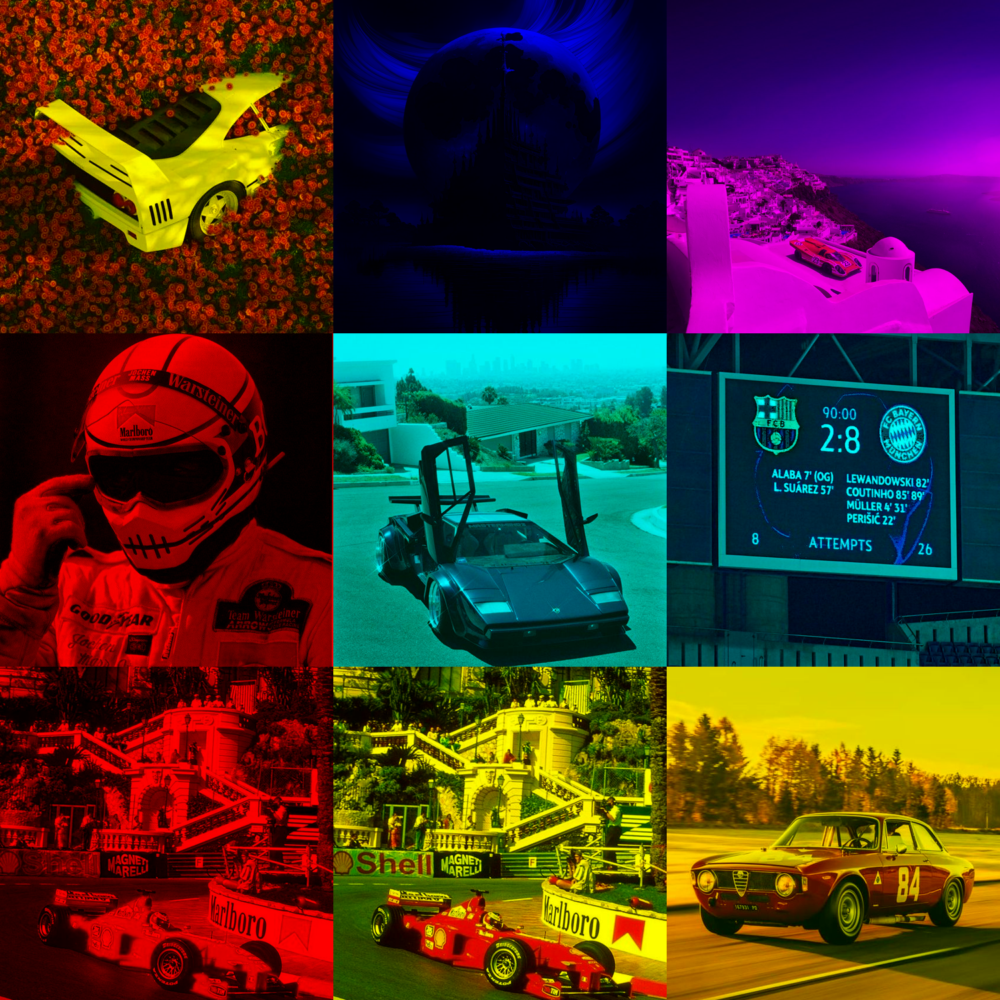

In [57]:
folder_path = r'D:\stud\pyt 5\Lab4\photos'
output_name = 'poster3x3.jpg'
columns = 3
rows = 3
post = create_poster(folder_path, output_name, columns, rows)
post

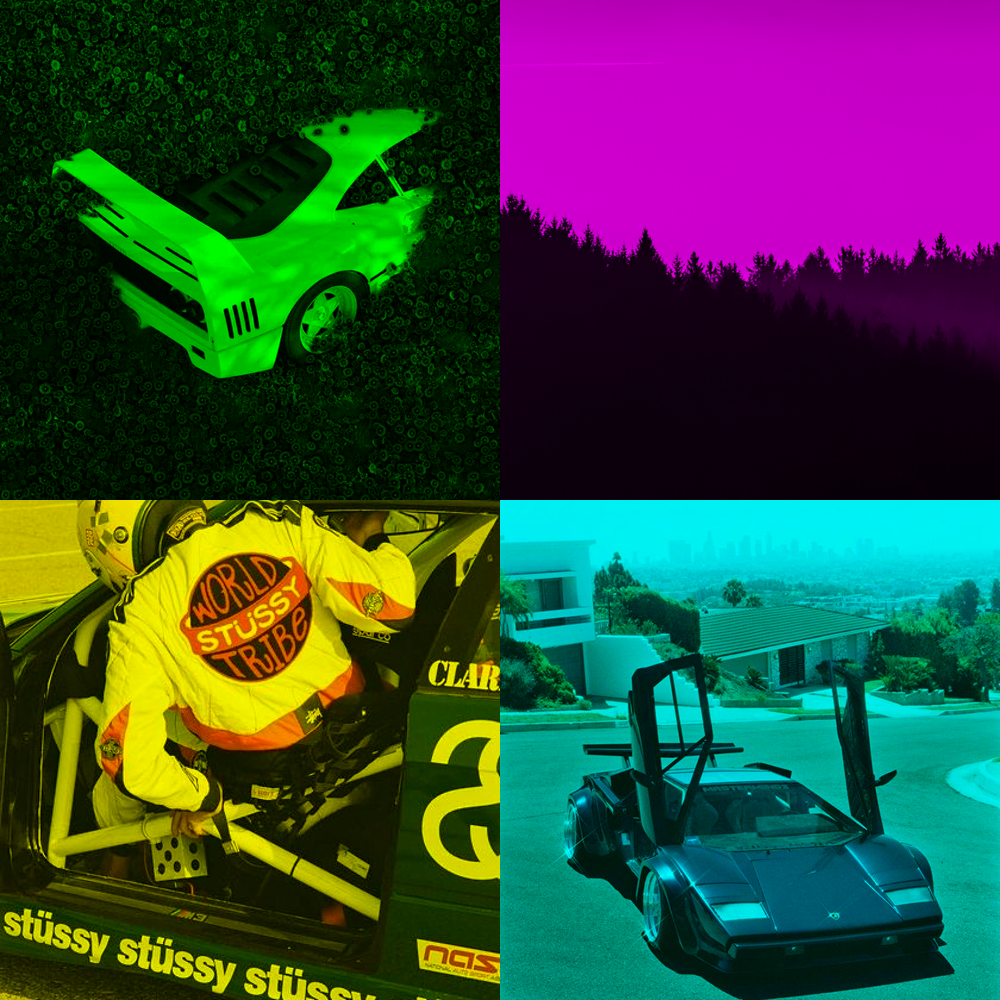

In [60]:
folder_path = r'D:\stud\pyt 5\Lab4\photos'
output_name = 'poster2x2.jpg'
columns = 2
rows = 2
post = create_poster(folder_path, output_name, columns, rows)
post

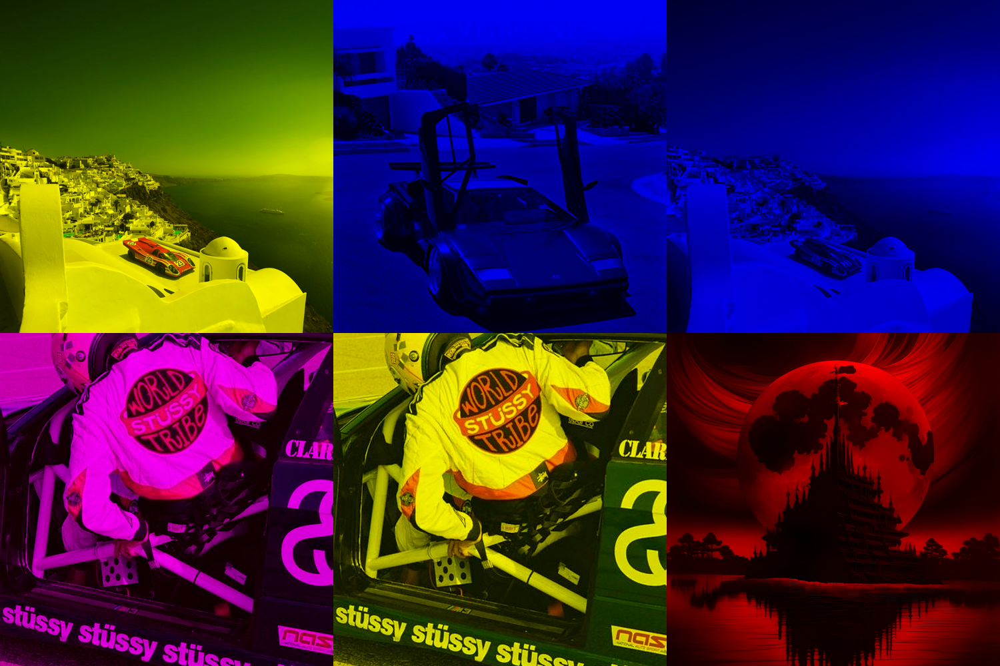

In [69]:
folder_path = r'D:\stud\pyt 5\Lab4\photos'
output_name = 'poster3x2.jpg'
columns = 3
rows = 2
post = create_poster(folder_path, output_name, columns, rows)
post

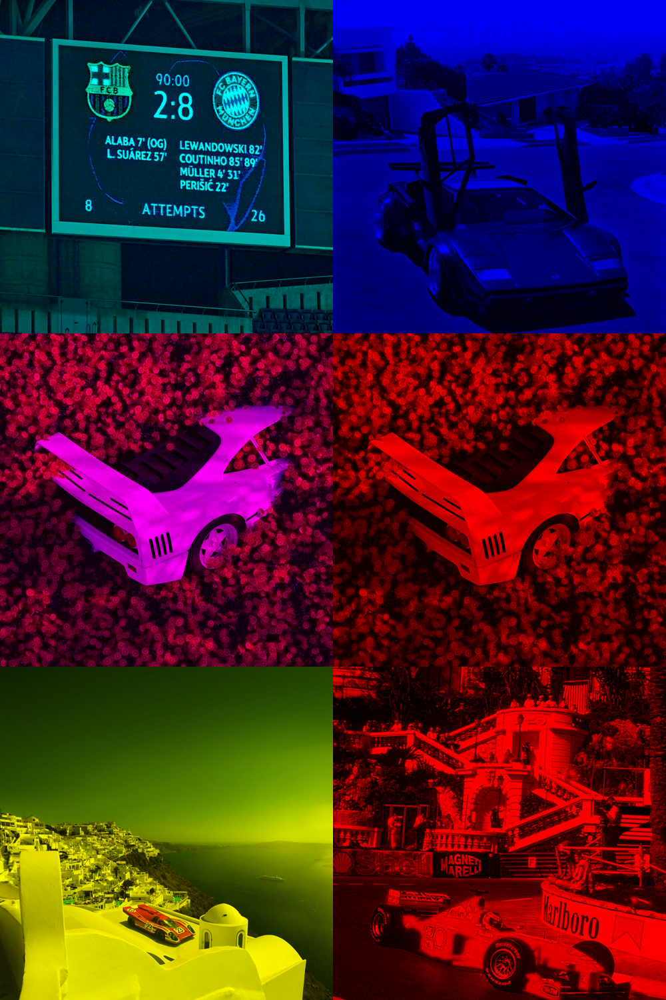

In [70]:
folder_path = r'D:\stud\pyt 5\Lab4\photos'
output_name = 'poster2x3.jpg'
columns = 2
rows = 3
post = create_poster(folder_path, output_name, columns, rows)
post